# Homework 3
### Author: Mateusz Sieniawski

In this notebook I use ImageNet pre-trained models and explain their predictions using LIME.

I downloaded pictures that consist both cats and dogs and analysed the models on them. In later parts of the notebook I run into some probles and also downloaded other images with different characteristics to see the differences between the models.

The code is based on an example from https://github.com/marcotcr/lime

Imports

In [202]:
import matplotlib.pyplot as plt
from PIL import Image
import torch.nn as nn
import numpy as np
import os, json

import torch
from torchvision import models, transforms
from torch.autograd import Variable
import torch.nn.functional as F

from lime import lime_image
from skimage.segmentation import mark_boundaries

Load ImageNet classes

In [203]:
idx2label, cls2label, cls2idx = [], {}, {}
with open(os.path.abspath('./data/imagenet_class_index.json'), 'r') as read_file:
    class_idx = json.load(read_file)
    idx2label = [class_idx[str(k)][1] for k in range(len(class_idx))]
    cls2label = {class_idx[str(k)][0]: class_idx[str(k)][1] for k in range(len(class_idx))}
    cls2idx = {class_idx[str(k)][0]: k for k in range(len(class_idx))}    

Define image transforms

In [204]:
# resize and take the center part of image to what our model expects
def get_input_transform():
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])       
    transf = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        normalize
    ])    

    return transf

def get_input_tensors(img):
    transf = get_input_transform()
    # unsqeeze converts single image to batch of 1
    return transf(img).unsqueeze(0)

Load and show example images

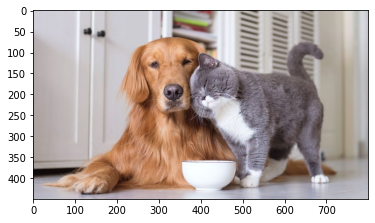

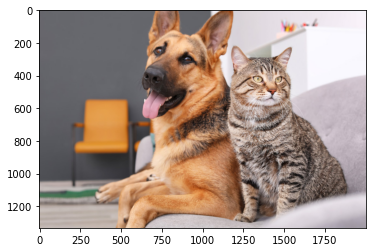

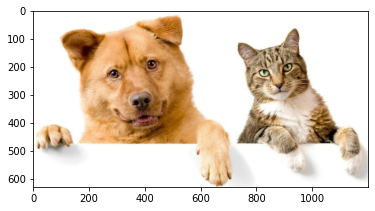

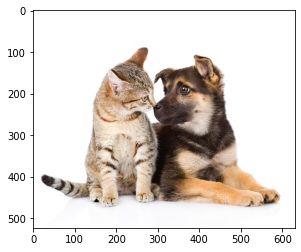

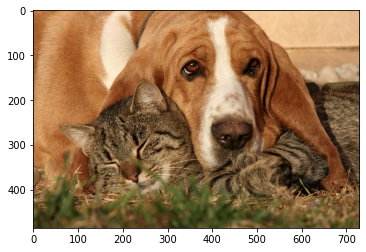

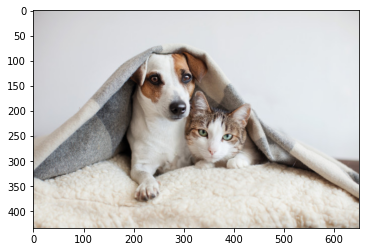

In [205]:
NO_IMAGES = 6

def get_image(path):
    with open(os.path.abspath(path), 'rb') as f:
        with Image.open(f) as img:
            return img.convert('RGB') 
        
images = [get_image(f'./data/img/cats_and_dogs/{i}.jpg') for i in range(NO_IMAGES)]
for img in images:
    plt.imshow(img)
    plt.show()

#### (1) For the selected data set, train a predictive model

I use here an inception_v3 model pretrained on ImageNet

In [206]:
inception = models.inception_v3(pretrained=True)

#### (2) for some selected observation from this dataset, calculate the model predictions for model (1)

Calculate the logits and pass that through softmax to get probabilities and class labels for top 5 predictions.

In [207]:
for img in images:
    img_t = get_input_tensors(img)
    inception.eval()
    logits = inception(img_t)

    probs = F.softmax(logits, dim=1)
    probs5 = probs.topk(5)
    print(tuple((p,c, idx2label[c]) for p, c in zip(probs5[0][0].detach().numpy(), probs5[1][0].detach().numpy())))

((0.9832697, 213, 'Irish_setter'), (0.012318987, 207, 'golden_retriever'), (0.0034723515, 168, 'redbone'), (0.00064222363, 211, 'vizsla'), (0.00010250766, 209, 'Chesapeake_Bay_retriever'))
((0.99998844, 235, 'German_shepherd'), (4.2734473e-06, 225, 'malinois'), (2.0633317e-06, 174, 'Norwegian_elkhound'), (1.04959e-06, 264, 'Cardigan'), (8.869288e-07, 465, 'bulletproof_vest'))
((0.999841, 260, 'chow'), (2.8184546e-05, 207, 'golden_retriever'), (1.9220884e-05, 235, 'German_shepherd'), (1.5166565e-05, 193, 'Australian_terrier'), (1.1747476e-05, 282, 'tiger_cat'))
((0.3055931, 281, 'tabby'), (0.29147804, 174, 'Norwegian_elkhound'), (0.14855218, 285, 'Egyptian_cat'), (0.09204333, 235, 'German_shepherd'), (0.06591202, 282, 'tiger_cat'))
((0.99946874, 161, 'basset'), (0.0004559311, 163, 'bloodhound'), (3.2315635e-05, 166, 'Walker_hound'), (1.827464e-05, 282, 'tiger_cat'), (1.1323567e-05, 167, 'English_foxhound'))
((0.5522362, 162, 'beagle'), (0.23432508, 264, 'Cardigan'), (0.18096848, 263, 'P

Prepare input for LIME explanations

In [208]:
def batch_predict_inception(images):
    inception.eval()
    batch = torch.stack(tuple(preprocess_transform(i) for i in images), dim=0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    inception.to(device)
    batch = batch.to(device)
    
    logits = inception(batch)
    probs = F.softmax(logits, dim=1)
    return probs.detach().cpu().numpy()

def get_pil_transform(): 
    transf = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224)
    ])    

    return transf

def get_preprocess_transform():
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])     
    transf = transforms.Compose([
        transforms.ToTensor(),
        normalize
    ])    

    return transf    

pill_transf = get_pil_transform()
preprocess_transform = get_preprocess_transform()

Let's test the function for the sample image.

In [237]:
test_pred = batch_predict_inception([pill_transf(images[0])])
test_pred.squeeze().argmax()

213

Create explanation for a sample image

In [211]:
explainer = lime_image.LimeImageExplainer()

In [254]:
explanation = explainer.explain_instance(np.array(pill_transf(images[0])), 
                                         batch_predict_inception, # classification function
                                         top_labels=5, 
                                         hide_color=0, 
                                         num_samples=1000) # number of images that will be sent to classification function

Use mask on image and see the areas that are encouraging the top prediction

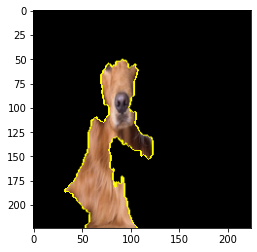

In [255]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=3, hide_rest=True)
img_boundry1 = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry1)

Now show the same explanaiton a bit differently:
- Don't hide the rest of the image
- Show parts of the image with negative impact on the prediction
- Use more features (regions of the picture)

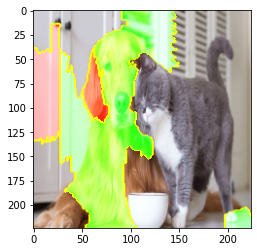

In [256]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
img_boundry2 = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry2)
plt.show()

Let's see how changing the number of features impact the explanation. Show the same explanation, but with increasing number of features, from the most important one to the least important.

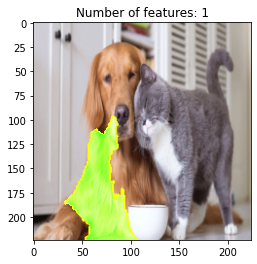

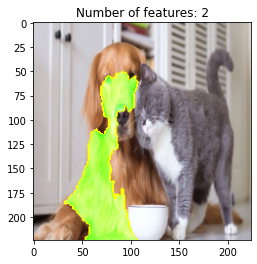

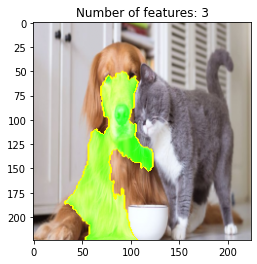

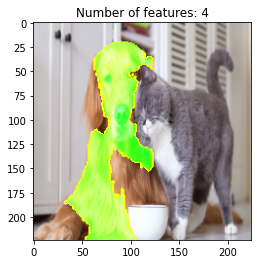

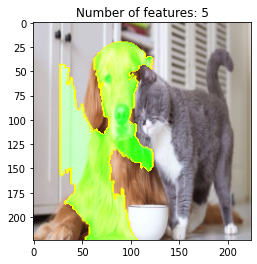

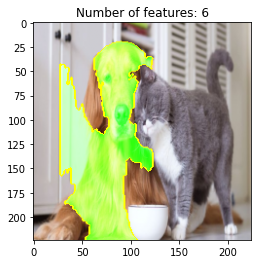

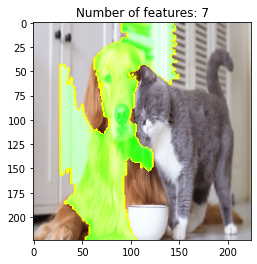

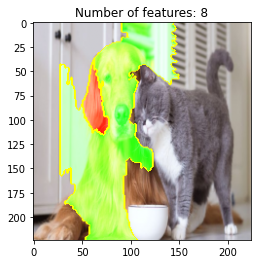

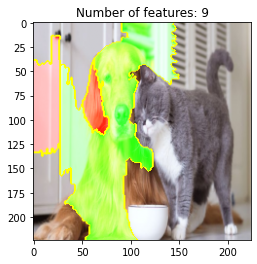

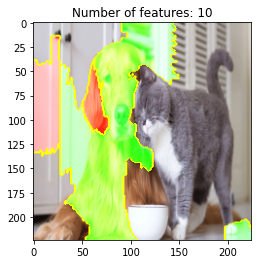

In [257]:
for num_features in range(1, 11):
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=num_features, hide_rest=False)
    img_boundry2 = mark_boundaries(temp/255.0, mask)
    plt.imshow(img_boundry2)
    plt.title(f"Number of features: {num_features}")
    plt.show()

#### (3) for an observation selected in (2), calculate the decomposition of model prediction using LIME / live / lime / localModel or similar technique (packages for R: live, live, localModel, iml, packages for python: lime).

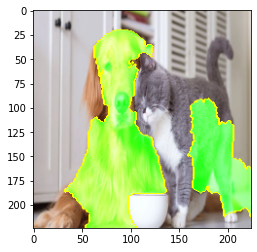

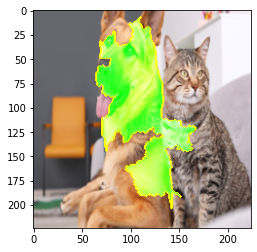

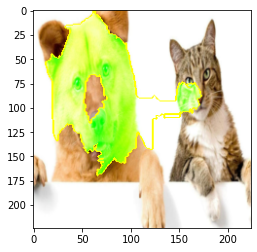

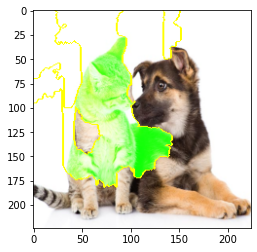

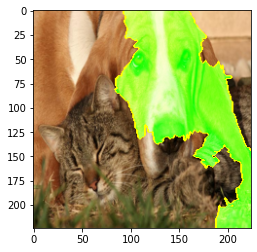

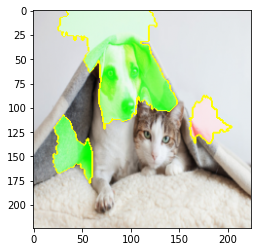

In [216]:
for i in range(NO_IMAGES):
    explanation = explainer.explain_instance(np.array(pill_transf(images[i])), 
                                             batch_predict_inception, # classification function
                                             top_labels=5, 
                                             hide_color=0, 
                                             num_samples=1000) # number of images that will be sent to classification function
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=8, hide_rest=False)
    img_boundry2 = mark_boundaries(temp/255.0, mask)
    plt.imshow(img_boundry2)
    plt.show()

#### (4) compare LIME decompositions for different observations in the dataset. How stable are these explanations?

For each image run the LIME explanation 5 times.

It can be seen that these explanations are stable. The most important 5 areas for the prediction result are more or less the same and are focused on the main predicion of the classifier.

Also I observed that using more samples in LIME explainer improves the quality of the explanation. Which makes sense, because LIME trains a linear approximation around the abservation thus using more samples makes it more accurate.

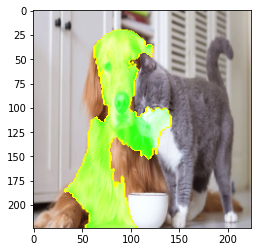

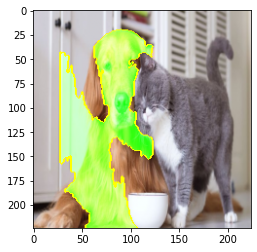

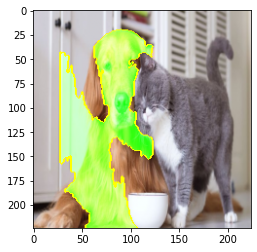

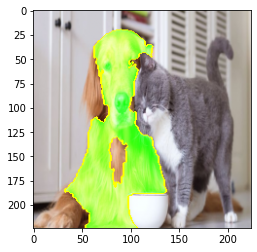

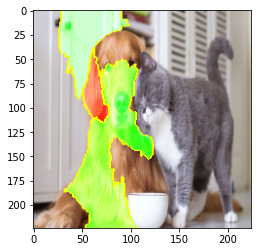

...

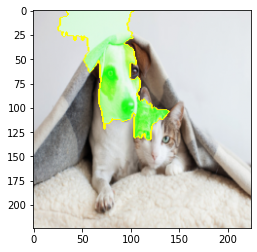

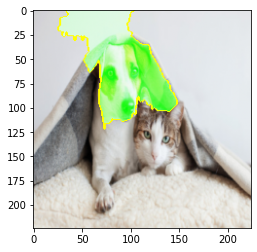

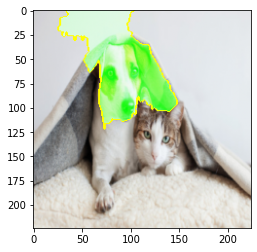

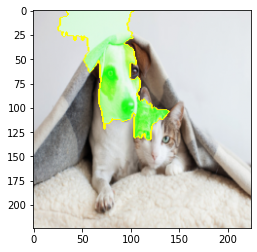

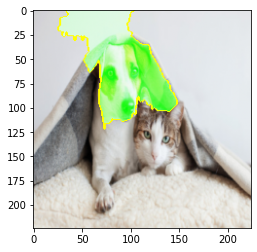

In [217]:
for img_num in range(NO_IMAGES):
    for _ in range(5):
        explanation = explainer.explain_instance(np.array(pill_transf(images[img_num])), 
                                                     batch_predict_inception, # classification function
                                                     top_labels=5, 
                                                     hide_color=0, 
                                                     num_samples=1000) # number of images that will be sent to classification function
        temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=5, hide_rest=False)
        img_boundry2 = mark_boundaries(temp/255.0, mask)
        plt.imshow(img_boundry2)
        plt.show()

#### (5) train a second model (of any class, neural nets, linear, other boosting) and find an observation for which LIME attributions are different between the models

The other model is ResNet18 pretrained on ImageNet

In [218]:
resnet = models.resnet18(pretrained=True)

Resnet inference

In [219]:
def batch_predict_resnet(images):
    resnet.eval()
    batch = torch.stack(tuple(preprocess_transform(i) for i in images), dim=0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    inception.to(device)
    batch = batch.to(device)
    
    logits = inception(batch)
    probs = F.softmax(logits, dim=1)
    return probs.detach().cpu().numpy()

Compare Inception and ResNet explanations

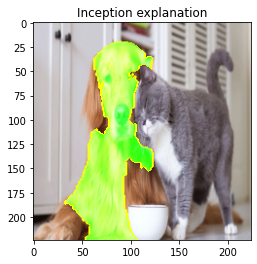

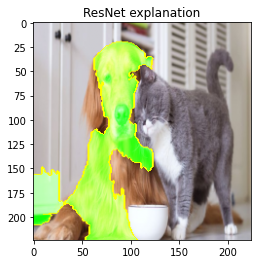

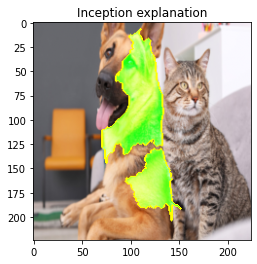

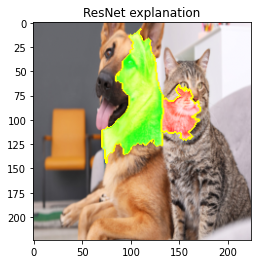

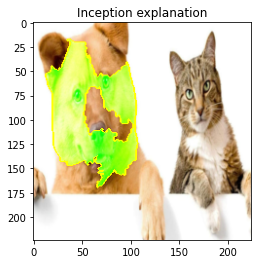

...

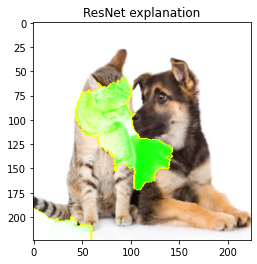

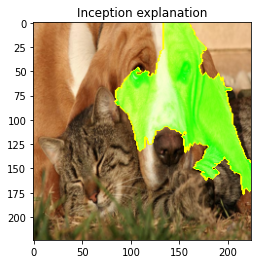

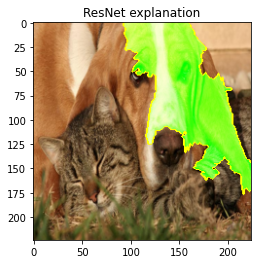

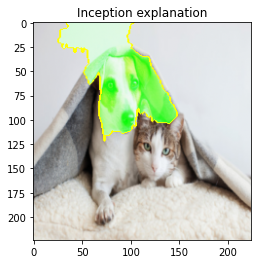

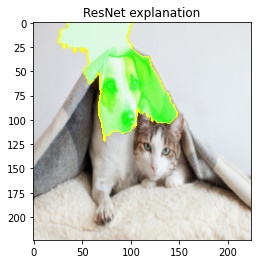

In [258]:
for img_num in range(NO_IMAGES):
    for (model, batch_predict) in (("Inception", batch_predict_inception), ("ResNet", batch_predict_resnet)):
        explanation = explainer.explain_instance(np.array(pill_transf(images[img_num])), 
                                                     batch_predict, # classification function
                                                     top_labels=5, 
                                                     hide_color=0, 
                                                     num_samples=1000) # number of images that will be sent to classification function
        temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=5, hide_rest=False)
        img_boundry2 = mark_boundaries(temp/255.0, mask)
        plt.imshow(img_boundry2)
        plt.title(f"{model} explanation")
        plt.show()

For pictures containing a cat and a dog both architectures give pretty much the same explanations. Now let's try some different types of pictures

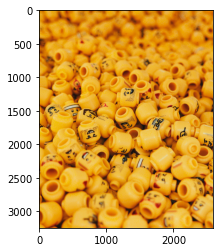

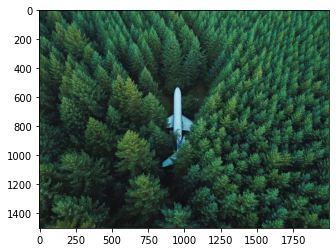

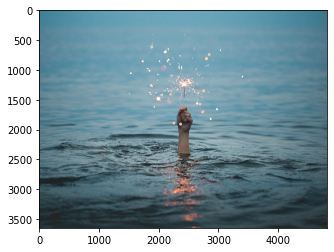

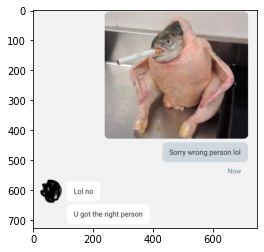

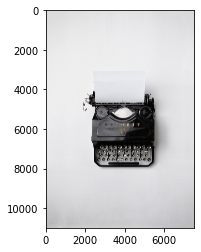

...

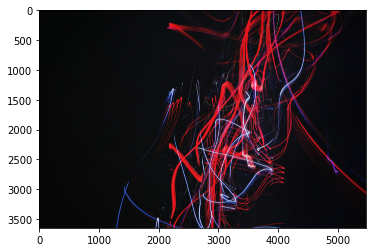

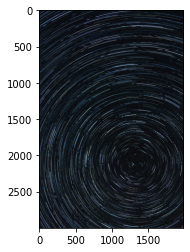

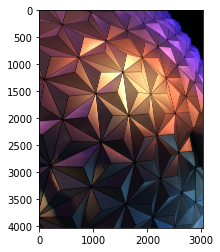

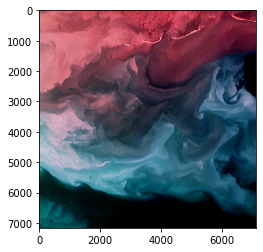

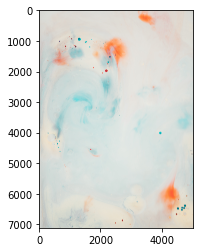

In [249]:
NO_RANDOM_IMAGES = 15

def get_image(path):
    with open(os.path.abspath(path), 'rb') as f:
        with Image.open(f) as img:
            return img.convert('RGB') 
        
r_images = [get_image(f'./data/img/random/{i}.jpg') for i in range(NO_RANDOM_IMAGES)]
for img in r_images:
    plt.imshow(img)
    plt.show()

Utility function for getting model's prediction label

In [250]:
def get_pred_label(predict, img):
    test_pred = batch_predict_inception([pill_transf(img)])
    pred_idx = test_pred.squeeze().argmax()
    pred_label = idx2label[pred_idx]
    return pred_label

Print Inception and ResNet predictions and LIME attributes

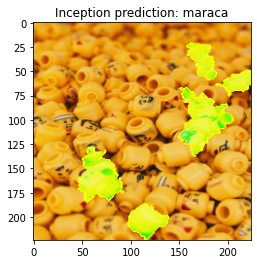

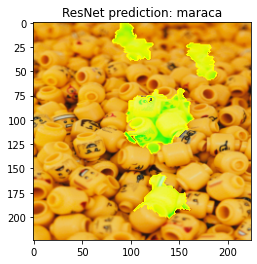

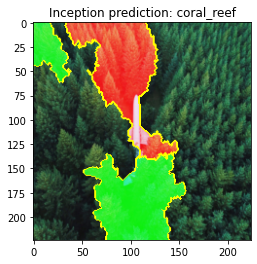

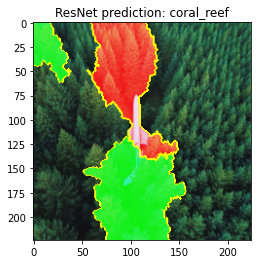

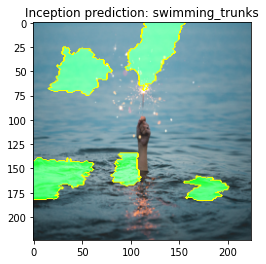

...

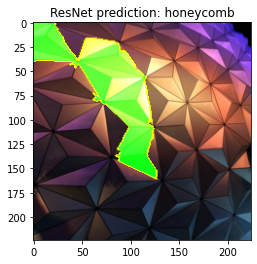

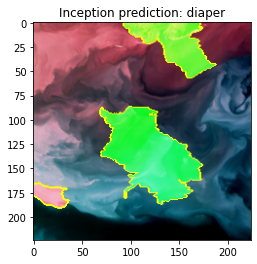

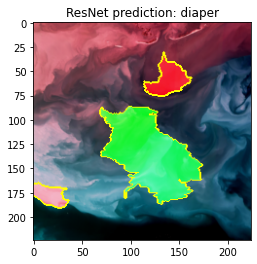

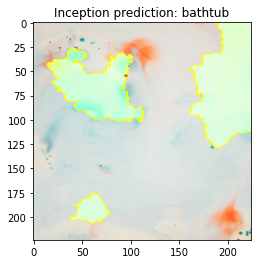

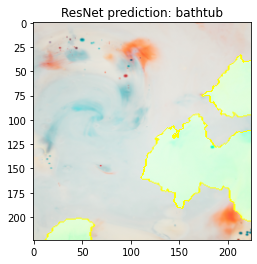

In [251]:
for img_num in range(NO_RANDOM_IMAGES):
    for (model_name, model, batch_predict) in (("Inception", inception, batch_predict_inception),
                                               ("ResNet", resnet, batch_predict_resnet)):
        img = r_images[img_num]
        explanation = explainer.explain_instance(np.array(pill_transf(img)), 
                                                     batch_predict, # classification function
                                                     top_labels=5, 
                                                     hide_color=0, 
                                                     num_samples=1000) # number of images that will be sent to classification function
        temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=5, hide_rest=False)
        img_boundry2 = mark_boundaries(temp/255.0, mask)
        plt.imshow(img_boundry2)
        
        pred_label = get_pred_label(batch_predict, img)
        plt.title(f"{model_name} prediction: {pred_label}")
        plt.show()

On these pictures the LIME attributes differ

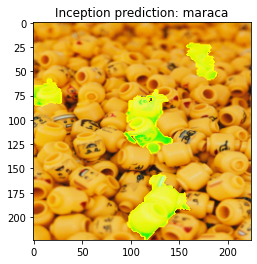

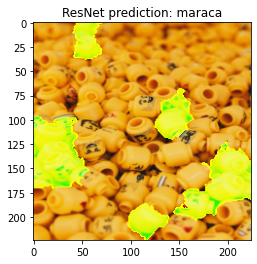

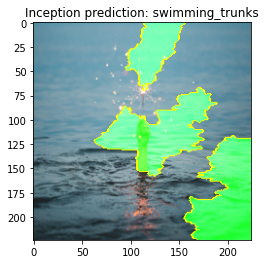

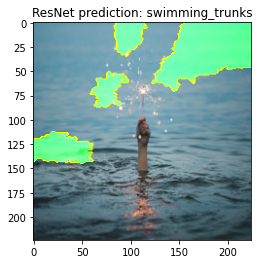

In [252]:
for img_num in (0, 2):
    for (model_name, model, batch_predict) in (("Inception", inception, batch_predict_inception),
                                               ("ResNet", resnet, batch_predict_resnet)):
        img = r_images[img_num]
        explanation = explainer.explain_instance(np.array(pill_transf(img)), 
                                                     batch_predict, # classification function
                                                     top_labels=5, 
                                                     hide_color=0, 
                                                     num_samples=1000) # number of images that will be sent to classification function
        temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=5, hide_rest=False)
        img_boundry2 = mark_boundaries(temp/255.0, mask)
        plt.imshow(img_boundry2)
        
        pred_label = get_pred_label(batch_predict, img)
        plt.title(f"{model_name} prediction: {pred_label}")
        plt.show()

#### (6) Comment on the results obtained in (4) and (5)

##### (4)

For each image I run the LIME explanation 5 times. These explanations were stable - they captured the most important part of the image and were mostly consistent between the runs.

Also I observed that using more samples in LIME explainer improves the quality of the explanation. Which makes sense, because LIME trains a linear approximation around the abservation thus using more samples makes it more accurate.

##### (5)

Both architectures beahaved almost the same on 'cats and dogs' pictures. Their predictions were the same, as their LIME attributions. Fun fact: these models are biased towards recognizing dogs

I tried to input pictures to the models such that their predictions would differ. Unfortuneatly, I was unsuccessfull. But their LIME attributions were different in some cases. When a model is shown a quasi-uniform picture e.g. most of the pictures is water surface or bunch of LEGO elements, then LIME attributions took any random subset of the image.

BTW ImageNet-trained CNNs are biased towards texture (https://arxiv.org/abs/1811.12231)
